# Necessary Functions

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"hoithngung","key":"11015a1bf79233b43854362666920c51"}'}

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d laithjj/diabetic-foot-ulcer-dfu

Dataset URL: https://www.kaggle.com/datasets/laithjj/diabetic-foot-ulcer-dfu
License(s): unknown
 99% 127M/129M [00:06<00:00, 24.5MB/s]
100% 129M/129M [00:06<00:00, 19.6MB/s]


In [ ]:
!unzip /content/diabetic-foot-ulcer-dfu.zip

Archive:  /content/diabetic-foot-ulcer-dfu.zip
  inflating: DFU/Original Images/1.jpg  
  inflating: DFU/Original Images/1.png  
  inflating: DFU/Original Images/10.jpg  
  inflating: DFU/Original Images/1054877509612379438.jpg  
  inflating: DFU/Original Images/1076771990506636278.jpg  
  inflating: DFU/Original Images/11.jpg  
  inflating: DFU/Original Images/12.jpg  
  inflating: DFU/Original Images/13.jpg  
  inflating: DFU/Original Images/14.jpg  
  inflating: DFU/Original Images/1430965400006561945.jpg  
  inflating: DFU/Original Images/15.jpg  
  inflating: DFU/Original Images/16.jpg  
  inflating: DFU/Original Images/17.JPG  
  inflating: DFU/Original Images/18.jpg  
  inflating: DFU/Original Images/19.jpg  
  inflating: DFU/Original Images/2 (2).jpg  
  inflating: DFU/Original Images/2.jpg  
  inflating: DFU/Original Images/2.png  
  inflating: DFU/Original Images/20.jpg  
  inflating: DFU/Original Images/21.jpg  
  inflating: DFU/Original Images/2100472819858240689.jpg  
  in

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
from IPython.core.display import display, HTML
# stop annoying tensorflow warning messages
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

# Functions

In [ ]:
def show_image_samples(gen ):
    t_dict=gen.class_indices
    classes=list(t_dict.keys())
    images,labels=next(gen) # get a sample batch from the generator
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]/255
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=12)
        plt.axis('off')
    plt.show()

In [ ]:
def show_images(tdir):
    classlist=os.listdir(tdir)
    length=len(classlist)
    columns=5
    rows=int(np.ceil(length/columns))
    plt.figure(figsize=(20, rows * 4))
    for i, klass in enumerate(classlist):
        classpath=os.path.join(tdir, klass)
        imgpath=os.path.join(classpath, '1.jpg')
        img=plt.imread(imgpath)
        plt.subplot(rows, columns, i+1)
        plt.axis('off')
        plt.title(klass, color='blue', fontsize=12)
        plt.imshow(img)

In [ ]:
# for RGB foreground and background
def print_in_color(txt_msg,fore_tupple,back_tupple,):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m'
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

In [ ]:
# Define a subclass of Keras callbacks that will control the learning rate and print training data in spreadsheet format. The callback also includes a feature to periodically ask if you want to train for N more epochs or halt
class LRA(keras.callbacks.Callback):
    def __init__(self,model, base_model, patience,stop_patience, threshold, factor, dwell, batches, initial_epoch,epochs, ask_epoch):
        super(LRA, self).__init__()
        self.model=model
        self.base_model=base_model
        self.patience=patience # specifies how many epochs without improvement before learning rate is adjusted
        self.stop_patience=stop_patience # specifies how many times to adjust lr without improvement to stop training
        self.threshold=threshold # specifies training accuracy threshold when lr will be adjusted based on validation loss
        self.factor=factor # factor by which to reduce the learning rate
        self.dwell=dwell
        self.batches=batches # number of training batch to runn per epoch
        self.initial_epoch=initial_epoch
        self.epochs=epochs
        self.ask_epoch=ask_epoch
        self.ask_epoch_initial=ask_epoch # save this value to restore if restarting training
        # callback variables
        self.count=0 # how many times lr has been reduced without improvement
        self.stop_count=0
        self.best_epoch=1   # epoch with the lowest loss
        self.initial_lr=float(tf.keras.backend.get_value(model.optimizer.lr)) # get the initiallearning rate and save it
        self.highest_tracc=0.0 # set highest training accuracy to 0 initially
        self.lowest_vloss=np.inf # set lowest validation loss to infinity initially
        self.best_weights=self.model.get_weights() # set best weights to model's initial weights
        self.initial_weights=self.model.get_weights()   # save initial weights if they have to get restored

    def on_train_begin(self, logs=None):
        if self.base_model != None:
            status=base_model.trainable
            if status:
                msg=' initializing callback starting train with base_model trainable'
            else:
                msg='initializing callback starting training with base_model not trainable'
        else:
            msg='initialing callback and starting training'
        print_in_color (msg, (244, 252, 3), (55,65,80))
        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print_in_color(msg, (244,252,3), (55,65,80))
        self.start_time= time.time()

    def on_train_end(self, logs=None):
        stop_time=time.time()
        tr_duration= stop_time- self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        self.model.set_weights(self.best_weights) # set the weights of the model to the best weights
        msg=f'Training is completed - model is set with weights from epoch {self.best_epoch} '
        print_in_color(msg, (0,255,0), (55,65,80))
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print_in_color(msg, (0,255,0), (55,65,80))

    def on_train_batch_end(self, batch, logs=None):
        acc=logs.get('accuracy')* 100  # get training accuracy
        loss=logs.get('loss')
        msg='{0:20s}processing batch {1:4s} of {2:5s} accuracy= {3:8.3f}  loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end='') # prints over on the same line to show running batch count

    def on_epoch_begin(self,epoch, logs=None):
        self.now= time.time()

    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        later=time.time()
        duration=later-self.now
        lr=float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
        current_lr=lr
        v_loss=logs.get('val_loss')  # get the validation loss for this epoch
        acc=logs.get('accuracy')  # get training accuracy
        v_acc=logs.get('val_accuracy')
        loss=logs.get('loss')
        if acc < self.threshold: # if training accuracy is below threshold adjust lr based on training accuracy
            monitor='accuracy'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (acc-self.highest_tracc )*100/self.highest_tracc
            if acc>self.highest_tracc: # training accuracy improved in the epoch
                self.highest_tracc=acc # set new highest training accuracy
                self.best_weights=self.model.get_weights() # traing accuracy improved so save the weights
                self.count=0 # set count to 0 since training accuracy improved
                self.stop_count=0 # set stop counter to 0
                if v_loss<self.lowest_vloss:
                    self.lowest_vloss=v_loss
                color= (0,255,0)
                self.best_epoch=epoch + 1  # set the value of best epoch for this epoch
            else:
                # training accuracy did not improve check if this has happened for patience number of epochs
                # if so adjust learning rate
                if self.count>=self.patience -1: # lr should be adjusted
                    color=(245, 170, 66)
                    lr= lr* self.factor # adjust the learning by factor
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    self.count=0 # reset the count to 0
                    self.stop_count=self.stop_count + 1 # count the number of consecutive lr adjustments
                    self.count=0 # reset counter
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space
                    else:
                        if v_loss<self.lowest_vloss:
                            self.lowest_vloss=v_loss
                else:
                    self.count=self.count +1 # increment patience counter
        else: # training accuracy is above threshold so adjust learning rate based on validation loss
            monitor='val_loss'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (self.lowest_vloss- v_loss )*100/self.lowest_vloss
            if v_loss< self.lowest_vloss: # check if the validation loss improved
                self.lowest_vloss=v_loss # replace lowest validation loss with new validation loss
                self.best_weights=self.model.get_weights() # validation loss improved so save the weights
                self.count=0 # reset count since validation loss improved
                self.stop_count=0
                color=(0,255,0)
                self.best_epoch=epoch + 1 # set the value of the best epoch to this epoch
            else: # validation loss did not improve
                if self.count>=self.patience-1: # need to adjust lr
                    color=(245, 170, 66)
                    lr=lr * self.factor # adjust the learning rate
                    self.stop_count=self.stop_count + 1 # increment stop counter because lr was adjusted
                    self.count=0 # reset counter
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space
                else:
                    self.count =self.count +1 # increment the patience counter
                if acc>self.highest_tracc:
                    self.highest_tracc= acc
        msg=f'{str(epoch+1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc*100:^9.3f}{v_loss:^9.5f}{v_acc*100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print_in_color (msg,color, (55,65,80))
        if self.stop_count> self.stop_patience - 1: # check if learning rate has been adjusted stop_count times with no improvement
            msg=f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print_in_color(msg, (0,255,255), (55,65,80))
            self.model.stop_training = True # stop training
        else:
            if self.ask_epoch !=None:
                if epoch + 1 >= self.ask_epoch:
                    if base_model.trainable:
                        msg='enter H to halt  or an integer for number of epochs to run then ask again'
                    else:
                        msg='enter H to halt ,F to fine tune model, or an integer for number of epochs to run then ask again'
                    print_in_color(msg, (0,255,255), (55,65,80))
                    ans=input('')
                    if ans=='H' or ans=='h':
                        msg=f'training has been halted at epoch {epoch + 1} due to user input'
                        print_in_color(msg, (0,255,255), (55,65,80))
                        self.model.stop_training = True # stop training
                    elif ans == 'F' or ans=='f':
                        if base_model.trainable:
                            msg='base_model is already set as trainable'
                        else:
                            msg='setting base_model as trainable for fine tuning of model'
                            self.base_model.trainable=True
                        print_in_color(msg, (0, 255,255), (55,65,80))
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print_in_color(msg, (244,252,3), (55,65,80))
                        self.count=0
                        self.stop_count=0
                        self.ask_epoch = epoch + 1 + self.ask_epoch_initial

                    else:
                        ans=int(ans)
                        self.ask_epoch +=ans
                        msg=f' training will continue until epoch ' + str(self.ask_epoch)
                        print_in_color(msg, (0, 255,255), (55,65,80))
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print_in_color(msg, (244,252,3), (55,65,80))

In [ ]:
# Define a function to plot the training data
def tr_plot(tr_data, start_epoch):
    #Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout
    #plt.style.use('fivethirtyeight')
    plt.show()

In [ ]:
# define a function to create confusion matrix and classification report
def print_info( test_gen, preds, print_code, save_dir, subject ):
    class_dict=test_gen.class_indices
    labels= test_gen.labels
    file_names= test_gen.filenames
    error_list=[]
    true_class=[]
    pred_class=[]
    prob_list=[]
    new_dict={}
    error_indices=[]
    y_pred=[]
    for key,value in class_dict.items():
        new_dict[value]=key             # dictionary {integer of class number: string of class name}
    # store new_dict as a text fine in the save_dir
    classes=list(new_dict.values())     # list of string of class names
    errors=0
    for i, p in enumerate(preds):
        pred_index=np.argmax(p)
        true_index=labels[i]  # labels are integer values
        if pred_index != true_index: # a misclassification has occurred
            error_list.append(file_names[i])
            true_class.append(new_dict[true_index])
            pred_class.append(new_dict[pred_index])
            prob_list.append(p[pred_index])
            error_indices.append(true_index)
            errors=errors + 1
        y_pred.append(pred_index)
    if print_code !=0:
        if errors>0:
            if print_code>errors:
                r=errors
            else:
                r=print_code
            msg='{0:^28s}{1:^28s}{2:^28s}{3:^16s}'.format('Filename', 'Predicted Class' , 'True Class', 'Probability')
            print_in_color(msg, (0,255,0),(55,65,80))
            for i in range(r):
                split1=os.path.split(error_list[i])
                split2=os.path.split(split1[0])
                fname=split2[1] + '/' + split1[1]
                msg='{0:^28s}{1:^28s}{2:^28s}{3:4s}{4:^6.4f}'.format(fname, pred_class[i],true_class[i], ' ', prob_list[i])
                print_in_color(msg, (255,255,255), (55,65,60))
                #print(error_list[i]  , pred_class[i], true_class[i], prob_list[i])
        else:
            msg='With accuracy of 100 % there are no errors to print'
            print_in_color(msg, (0,255,0),(55,65,80))
    if errors>0:
        plot_bar=[]
        plot_class=[]
        for  key, value in new_dict.items():
            count=error_indices.count(key)
            if count!=0:
                plot_bar.append(count) # list containg how many times a class c had an error
                plot_class.append(value)   # stores the class
        fig=plt.figure()
        fig.set_figheight(len(plot_class)/3)
        fig.set_figwidth(10)
        plt.style.use('fivethirtyeight')
        for i in range(0, len(plot_class)):
            c=plot_class[i]
            x=plot_bar[i]
            plt.barh(c, x, )
            plt.title( ' Errors by Class on Test Set')
    y_true= np.array(labels)
    y_pred=np.array(y_pred)
    if len(classes)<= 30:
        # create a confusion matrix
        cm = confusion_matrix(y_true, y_pred )
        length=len(classes)
        if length<8:
            fig_width=8
            fig_height=8
        else:
            fig_width= int(length * .5)
            fig_height= int(length * .5)
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(length)+.5, classes, rotation= 90)
        plt.yticks(np.arange(length)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes)
    print("Classification Report:\n----------------------\n", clr)


In [ ]:
# define a function to save the model and the associated class_dict.csv file
def saver(save_path, model, model_name, subject, accuracy,img_size, scalar, generator):
    # first save the model
    save_id=str (model_name +  '-' + subject +'-'+ str(acc)[:str(acc).rfind('.')+3] + '.h5')
    model_save_loc=os.path.join(save_path, save_id)
    model.save(model_save_loc)
    print_in_color ('model was saved as ' + model_save_loc, (0,255,0),(55,65,80))
    # now create the class_df and convert to csv file
    class_dict=generator.class_indices
    height=[]
    width=[]
    scale=[]
    for i in range(len(class_dict)):
        height.append(img_size[0])
        width.append(img_size[1])
        scale.append(scalar)
    Index_series=pd.Series(list(class_dict.values()), name='class_index')
    Class_series=pd.Series(list(class_dict.keys()), name='class')
    Height_series=pd.Series(height, name='height')
    Width_series=pd.Series(width, name='width')
    Scale_series=pd.Series(scale, name='scale by')
    class_df=pd.concat([Index_series, Class_series, Height_series, Width_series, Scale_series], axis=1)
    csv_name='class_dict.csv'
    csv_save_loc=os.path.join(save_path, csv_name)
    class_df.to_csv(csv_save_loc, index=False)
    print_in_color ('class csv file was saved as ' + csv_save_loc, (0,255,0),(55,65,80))
    return model_save_loc, csv_save_loc

In [ ]:
# define a function that uses the trained model and the class_dict.csv file to predict images
def predictor(sdir, csv_path,  model_path, crop_image = False):
    # read in the csv file
    class_df=pd.read_csv(csv_path)
    img_height=int(class_df['height'].iloc[0])
    img_width =int(class_df['width'].iloc[0])
    img_size=(img_width, img_height)
    scale=class_df['scale by'].iloc[0]
    try:
        s=int(scale)
        s2=1
        s1=0
    except:
        split=scale.split('-')
        s1=float(split[1])
        s2=float(split[0].split('*')[1])
        print (s1,s2)
    path_list=[]
    paths=os.listdir(sdir)
    for f in paths:
        path_list.append(os.path.join(sdir,f))
    print (' Model is being loaded- this will take about 10 seconds')
    model=load_model(model_path)
    image_count=len(path_list)
    index_list=[]
    prob_list=[]
    cropped_image_list=[]
    good_image_count=0
    for i in range (image_count):
        img=cv2.imread(path_list[i])
        if crop_image == True:
            status, img=crop(img)
        else:
            status=True
        if status== True:
            good_image_count +=1
            img=cv2.resize(img, img_size)
            cropped_image_list.append(img)
            img=img*s2 - s1
            img=np.expand_dims(img, axis=0)
            p= np.squeeze (model.predict(img))
            index=np.argmax(p)
            prob=p[index]
            index_list.append(index)
            prob_list.append(prob)
    if good_image_count==1:
        class_name= class_df['class'].iloc[index_list[0]]
        probability= prob_list[0]
        img=cropped_image_list [0]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
        plt.imshow(img)
        return class_name, probability
    elif good_image_count == 0:
        return None, None
    most=0
    for i in range (len(index_list)-1):
        key= index_list[i]
        keycount=0
        for j in range (i+1, len(index_list)):
            nkey= index_list[j]
            if nkey == key:
                keycount +=1
        if keycount> most:
            most=keycount
            isave=i
    best_index=index_list[isave]
    psum=0
    bestsum=0
    for i in range (len(index_list)):
        psum += prob_list[i]
        if index_list[i]==best_index:
            bestsum += prob_list[i]
    img= cropped_image_list[isave]/255
    class_name=class_df['class'].iloc[best_index]
    plt.title(class_name, color='blue', fontsize=16)
    plt.axis('off')
    plt.imshow(img)
    return class_name, bestsum/image_count

In [ ]:
# define a function tha takes in a dataframe df, and integer max_size and a string column and returns a dataframe where the number of samples for any class specified by column is limited to max samples
def trim (df, max_size, min_size, column):
    df=df.copy()
    sample_list=[]
    groups=df.groupby(column)
    for label in df[column].unique():
        group=groups.get_group(label)
        sample_count=len(group)
        if sample_count> max_size :
            samples=group.sample(max_size, replace=False, weights=None, random_state=123, axis=0).reset_index(drop=True)
            sample_list.append(samples)
        elif sample_count>= min_size:
            sample_list.append(group)
    df=pd.concat(sample_list, axis=0).reset_index(drop=True)
    balance=list(df[column].value_counts())
    print (balance)
    return df

(2659, 1265, 3)


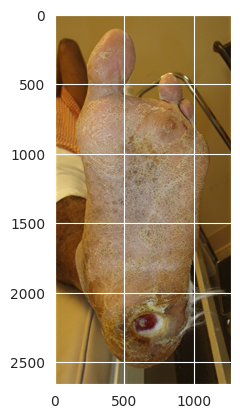

In [ ]:
fpath=r'/content/DFU/Original Images/14.jpg'
img=plt.imread(fpath)
print (img.shape)
imshow(img)

In [ ]:
import os

# Paths to the directories
abnormal_path = '/content/DFU/Patches/Abnormal(Ulcer)'
normal_path = '/content/DFU/Patches/Normal(Healthy skin)'

# Function to count image files in a directory
def count_images(folder_path):
    if os.path.exists(folder_path):
        return len([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    else:
        return 0  # Return 0 if the folder does not exist

# Count images in each directory
abnormal_count = count_images(abnormal_path)
normal_count = count_images(normal_path)

# Print the results
print(f"Number of images in Abnormal(Ulcer): {abnormal_count}")
print(f"Number of images in Normal(Healthy skin): {normal_count}")


Number of images in Abnormal(Ulcer): 512
Number of images in Normal(Healthy skin): 543


In [ ]:
# define function to preprocess the dataframe
def preprocess (sdir, trsplit, vsplit):
    filepaths=[]
    labels=[]
    classlist=os.listdir(sdir)
    for klass in classlist:
        classpath=os.path.join(sdir,klass)
        flist=os.listdir(classpath)
        for f in flist:
            fpath=os.path.join(classpath,f)
            filepaths.append(fpath)
            labels.append(klass)
    Fseries=pd.Series(filepaths, name='filepaths')
    Lseries=pd.Series(labels, name='labels')
    df=pd.concat([Fseries, Lseries], axis=1)
    # split df into train_df and test_df
    dsplit=vsplit/(1-trsplit)
    strat=df['labels']
    train_df, dummy_df=train_test_split(df, train_size=trsplit, shuffle=True, random_state=123, stratify=strat)
    strat=dummy_df['labels']
    valid_df, test_df=train_test_split(dummy_df, train_size=dsplit, shuffle=True, random_state=123, stratify=strat)
    print('train_df length: ', len(train_df), '  test_df length: ',len(test_df), '  valid_df length: ', len(valid_df))
    print(train_df['labels'].value_counts())
    return train_df, test_df, valid_df

# Patches Input

Import Libraries

In [ ]:
import os
import shutil
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from PIL import Image

 Define Helper Functions for Image Processing And Basic Augmentation for Original Dataset

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from PIL import Image, ImageEnhance
import shutil

# Constants for image properties and paths
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
TARGET_IMAGES_PER_CLASS = 10000  # Final desired number of images per class

# Update the number of original images for each class
ORIGINAL_IMAGES = {
    'Normal(Healthy skin)': 543,
    'Abnormal(Ulcer)': 512
}

data_dir = '/content/DFU/Patches'
save_dir = '/content/DFU/AugmentedData/'
destination_dir = '/content/DFU/TrainingData'

# Create necessary directories if they don't exist
os.makedirs(save_dir, exist_ok=True)
os.makedirs(destination_dir, exist_ok=True)

# Create subdirectories for Abnormal and Normal
for folder in ['Normal(Healthy skin)', 'Abnormal(Ulcer)']:
    subfolder_path = os.path.join(destination_dir, folder)
    os.makedirs(subfolder_path, exist_ok=True)

# Function to resize image with padding
def resize_with_padding(image, target_size):
    old_size = image.size
    ratio = min(target_size[0] / old_size[0], target_size[1] / old_size[1])
    new_size = (int(old_size[0] * ratio), int(old_size[1] * ratio))
    image = image.resize(new_size, Image.LANCZOS)

    new_image = Image.new("RGB", target_size, (255, 255, 255))
    new_image.paste(image, ((target_size[0] - new_size[0]) // 2,
                            (target_size[1] - new_size[1]) // 2))
    return new_image

# Function to add Gaussian noise (low intensity)
def add_gaussian_noise(image):
    if len(image.shape) == 3:  # Ensure image has 3 dimensions (H, W, C)
        noise = np.random.normal(0, 1.5, image.shape)  # Low noise intensity
        noisy_image = np.clip(image + noise, 0, 255).astype(np.uint8)
        return noisy_image
    return image

# Function to apply random crop
def random_crop(image, crop_size):
    width, height = image.size
    crop_width, crop_height = crop_size
    left = np.random.randint(0, width - crop_width + 1)
    top = np.random.randint(0, height - crop_height + 1)
    return image.crop((left, top, left + crop_width, top + crop_height))

# Function to randomly adjust color
def random_color_transform(image):
    enhancer = ImageEnhance.Color(image)
    factor = np.random.uniform(0.95, 1.05)  # Slight color adjustment
    return enhancer.enhance(factor)

# Function to copy files from source to destination
def copy_images(source_dir, destination_subdir):
    for filename in os.listdir(source_dir):
        source_path = os.path.join(source_dir, filename)
        destination_path = os.path.join(destination_subdir, filename)
        if not os.path.exists(destination_path):  # Avoid overwriting
            shutil.copy(source_path, destination_path)
            print(f"Copied {filename} to {destination_subdir}")

# Augmentation process
for folder, original_count in ORIGINAL_IMAGES.items():
    folder_path = os.path.join(data_dir, folder)
    save_folder = os.path.join(save_dir, folder)
    os.makedirs(save_folder, exist_ok=True)

    # Load all original images
    all_images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = load_img(img_path)
        img = resize_with_padding(img, (IMAGE_WIDTH, IMAGE_HEIGHT))
        all_images.append(img_to_array(img))
    all_images = np.array(all_images)

    # Start augmentation
    augment_needed = TARGET_IMAGES_PER_CLASS - original_count
    start_number = original_count + 1

    print(f"Augmenting for {folder}. Existing: {original_count}. Need to augment: {augment_needed}.")

    datagen = ImageDataGenerator(
        rotation_range=10,               # Moderate rotation range
        brightness_range=[0.9, 1.1],     # Wider brightness adjustment
        horizontal_flip=True,            # Horizontal flip
        zoom_range=[0.9, 1.1],           # Larger zoom range
        width_shift_range=0.1,           # Larger horizontal shift
        height_shift_range=0.1           # Larger vertical shift
    )

    # Generate augmented images from all images
    for batch in datagen.flow(all_images, batch_size=1):
        augmented_image = (batch[0]).astype(np.uint8)

        # Add Gaussian noise to 10% of images
        if np.random.rand() < 0.1:
            augmented_image = add_gaussian_noise(augmented_image)

        # Apply random crop to 20% of images
        if np.random.rand() < 0.2:
            img_pil = Image.fromarray(augmented_image)
            cropped = random_crop(img_pil, (200, 200))
            augmented_image = np.array(resize_with_padding(cropped, (IMAGE_WIDTH, IMAGE_HEIGHT)))

        # Adjust color for 10% of images
        if np.random.rand() < 0.1:
            img_pil = Image.fromarray(augmented_image)
            augmented_image = np.array(random_color_transform(img_pil))

        # Resize back to target size after random cropping or transformations
        img_pil = Image.fromarray(augmented_image)  # Convert numpy array to PIL Image
        img_resized = resize_with_padding(img_pil, (IMAGE_WIDTH, IMAGE_HEIGHT))

        # Save the augmented image
        unique_filename = f"{start_number}.jpg"
        img_resized.save(os.path.join(save_folder, unique_filename))

        augment_needed -= 1
        start_number += 1
        if augment_needed <= 0:
            break

    print(f"Completed augmentation for {folder}. Total images: {TARGET_IMAGES_PER_CLASS}")

    # After augmentation, copy original and augmented images to new destination
    augmented_path = os.path.join(save_dir, folder)
    destination_subdir = os.path.join(destination_dir, folder)

    print(f"Copying original images from {folder_path} to {destination_subdir}")
    copy_images(folder_path, destination_subdir)

    print(f"Copying augmented images from {augmented_path} to {destination_subdir}")
    copy_images(augmented_path, destination_subdir)

print("All images have been moved to the new training directory.")

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
Copied 2134.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 985.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 6004.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 7093.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 4052.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 5526.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 748.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 9884.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 8278.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 7859.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 9916.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 1785.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 3213.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 1425.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 3158.jpg to /content/DFU/TrainingData/Abnormal(Ulcer)
Copied 4056.jpg to /content/DF

Count Augmented Images

In [ ]:
# Count augmented images in the directory
augmented_folder = '/content/DFU/TrainingData/'
for folder in ['Normal(Healthy skin)', 'Abnormal(Ulcer)']:
    num_files = len(os.listdir(os.path.join(augmented_folder, folder)))
    print(f"Number of images in folder {folder}: {num_files}")

Number of images in folder Normal(Healthy skin): 10000
Number of images in folder Abnormal(Ulcer): 9999


In [ ]:
sdir = '/content/DFU/TrainingData'
train_df, test_df, valid_df = preprocess(sdir, 0.7, 0.2)  # Adjust `preprocess` as needed to return these DataFrames

# Ensure the above line runs successfully and returns train_df, test_df, and valid_df


train_df length:  13999   test_df length:  2000   valid_df length:  4000
labels
Normal(Healthy skin)    7000
Abnormal(Ulcer)         6999
Name: count, dtype: int64


Remove Corrupted Images from DataFrames

In [ ]:
def remove_corrupted_images(df):
    valid_filepaths = []
    labels = []
    for filepath, label in zip(df['filepaths'], df['labels']):
        try:
            img = Image.open(filepath)
            img.verify()  # Verify that this is a valid image
            valid_filepaths.append(filepath)
            labels.append(label)
        except (IOError, SyntaxError):
            print(f"Corrupted file removed: {filepath}")
    return pd.DataFrame({'filepaths': valid_filepaths, 'labels': labels})

# Remove corrupted images in each DataFrame
train_df = remove_corrupted_images(train_df)
test_df = remove_corrupted_images(test_df)
valid_df = remove_corrupted_images(valid_df)

# Print updated sizes
print(f"Updated training set size: {len(train_df)}")
print(f"Updated test set size: {len(test_df)}")
print(f"Updated validation set size: {len(valid_df)}")


Updated training set size: 13999
Updated test set size: 2000
Updated validation set size: 4000


Initialize ImageDataGenerators and Validate Data Integrity

In [ ]:
batch_size = 30
test_batch_size = 4

train_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    train_df, x_col='filepaths', y_col='labels', target_size=(224, 224), class_mode='categorical',
    color_mode='rgb', shuffle=True, batch_size=batch_size)

test_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    test_df, x_col='filepaths', y_col='labels', target_size=(224, 224), class_mode='categorical',
    color_mode='rgb', shuffle=False, batch_size=test_batch_size)

valid_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    valid_df, x_col='filepaths', y_col='labels', target_size=(224, 224), class_mode='categorical',
    color_mode='rgb', shuffle=True, batch_size=batch_size)

print(f"Final generator training set size: {train_gen.n}")
print(f"Final generator test set size: {test_gen.n}")
print(f"Final generator validation set size: {valid_gen.n}")


Found 13999 validated image filenames belonging to 2 classes.
Found 2000 validated image filenames belonging to 2 classes.
Found 4000 validated image filenames belonging to 2 classes.
Final generator training set size: 13999
Final generator test set size: 2000
Final generator validation set size: 4000


Verify Class Distribution

In [ ]:
print("Training set class distribution:")
print(train_df['labels'].value_counts())

print("\nTest set class distribution:")
print(test_df['labels'].value_counts())

print("\nValidation set class distribution:")
print(valid_df['labels'].value_counts())


Training set class distribution:
labels
Normal(Healthy skin)    7000
Abnormal(Ulcer)         6999
Name: count, dtype: int64

Test set class distribution:
labels
Abnormal(Ulcer)         1000
Normal(Healthy skin)    1000
Name: count, dtype: int64

Validation set class distribution:
labels
Normal(Healthy skin)    2000
Abnormal(Ulcer)         2000
Name: count, dtype: int64


# **Data Visualization**

**1.Display Original Images**

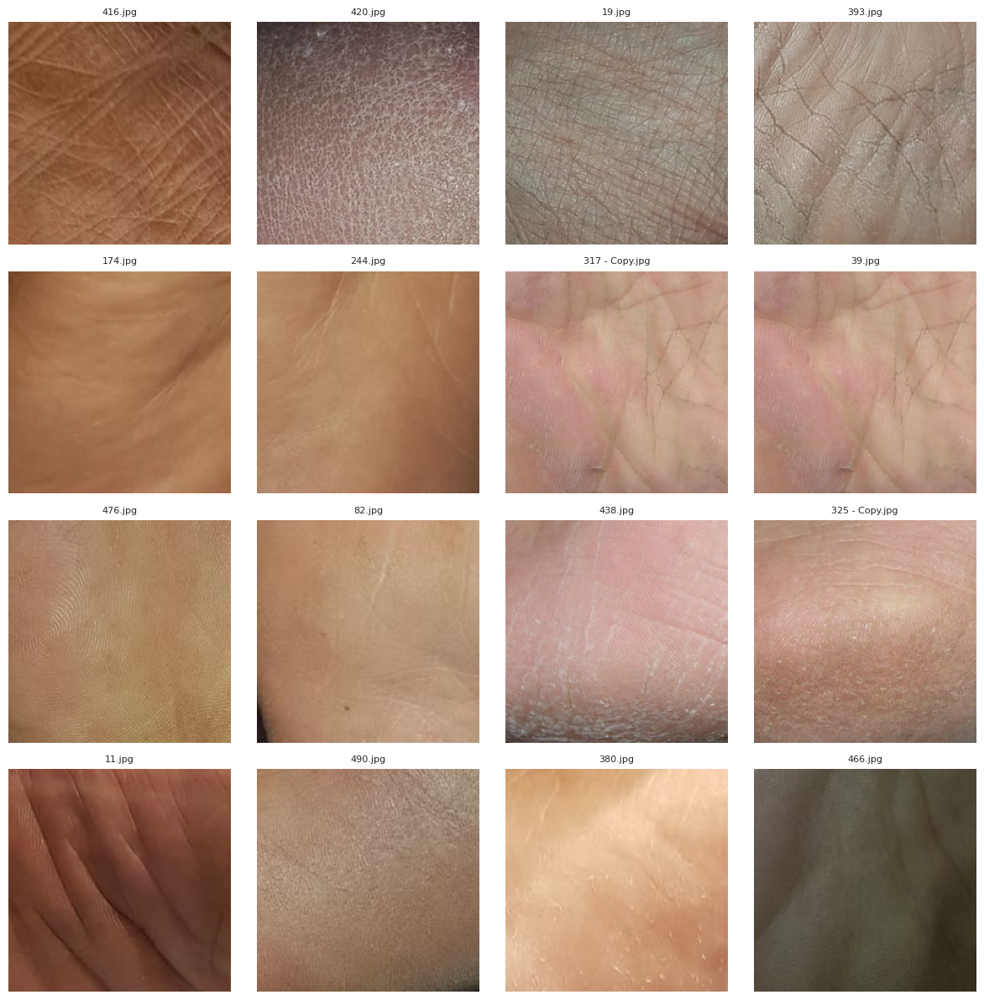

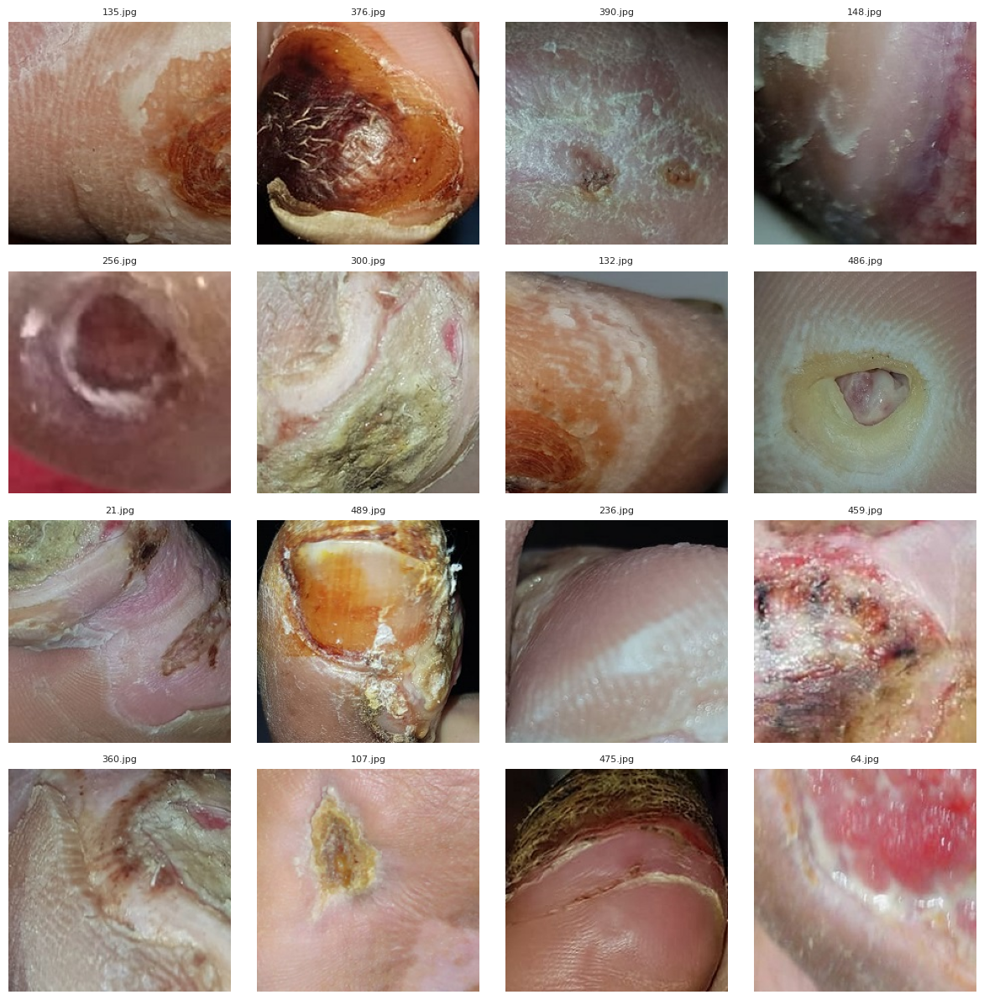

In [ ]:
# Define the base directory for image files
original_dir = '/content/DFU/Patches'
# Function to visualize original images
def visualize_original_images(class_name, num_images=16):
    folder = os.path.join(original_dir, class_name)
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sample_images = np.random.choice(files, size=min(num_images, len(files)), replace=False)

    plt.figure(figsize=(12, 12))
    grid_size = int(np.ceil(np.sqrt(len(sample_images))))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(folder, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img_array)
        plt.axis('off')
        plt.title(f'{img_file}', fontsize=8)

    plt.tight_layout()
    plt.show()

# Example usage
visualize_original_images('Normal(Healthy skin)', num_images=16)
visualize_original_images('Abnormal(Ulcer)', num_images=16)

**2.Visualize Augmented Images**

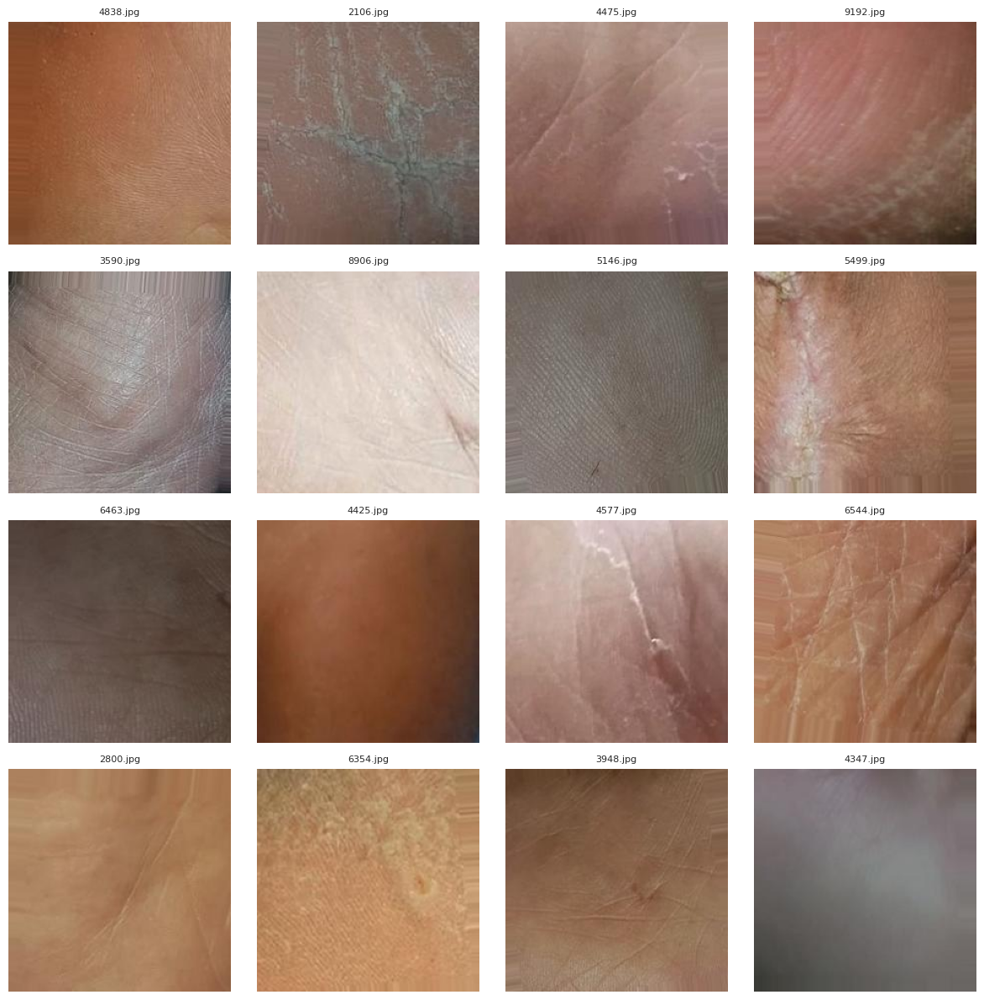

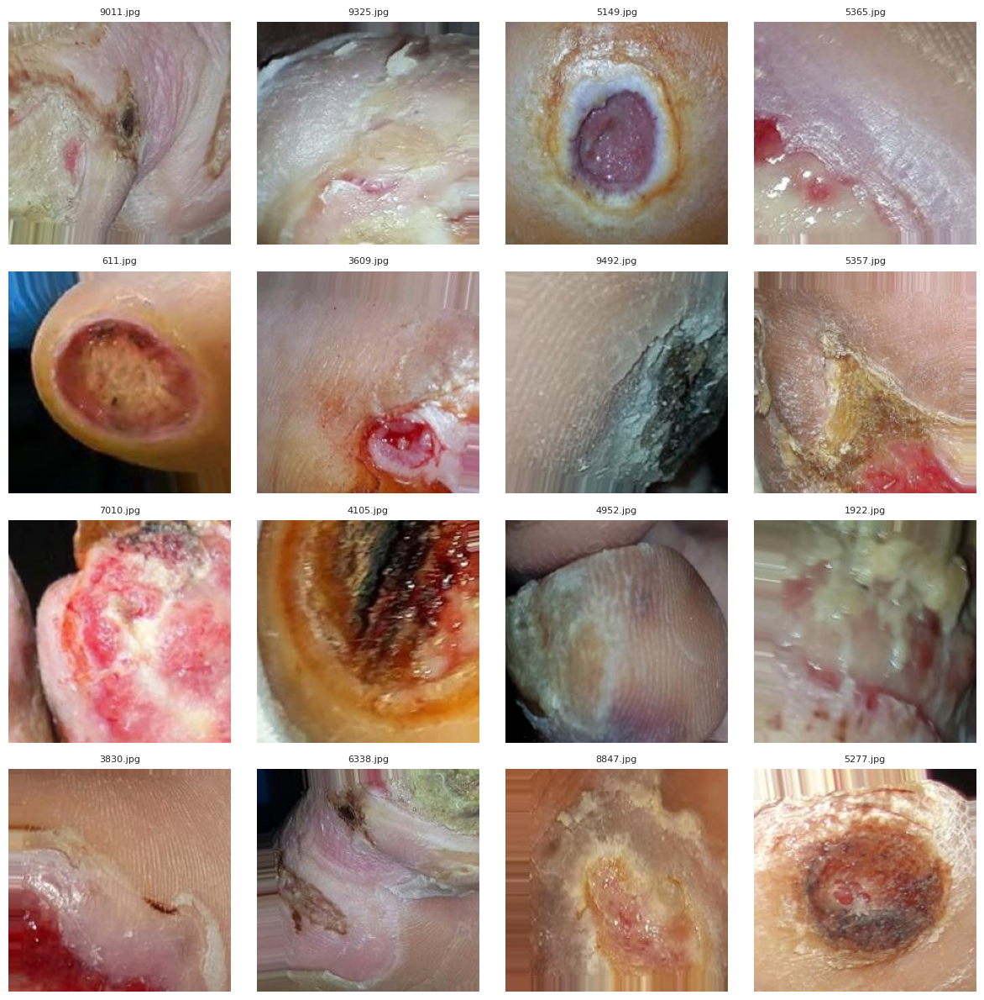

In [ ]:
# Function to visualize augmented images
def visualize_augmented_images(class_name, augmented_dir, num_images=16):
    folder = os.path.join(augmented_dir, class_name)
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sample_images = np.random.choice(files, size=min(num_images, len(files)), replace=False)

    plt.figure(figsize=(12, 12))
    grid_size = int(np.ceil(np.sqrt(len(sample_images))))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(folder, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img_array)
        plt.axis('off')
        plt.title(f'{img_file}', fontsize=8)

    plt.tight_layout()
    plt.show()

# Example usage
visualize_augmented_images('Normal(Healthy skin)', augmented_dir='/content/DFU/AugmentedData', num_images=16)
visualize_augmented_images('Abnormal(Ulcer)', augmented_dir='/content/DFU/AugmentedData', num_images=16)

**3.Visualize Preprocessed Images (Canny Edge Detection and Histogram Equalization)**

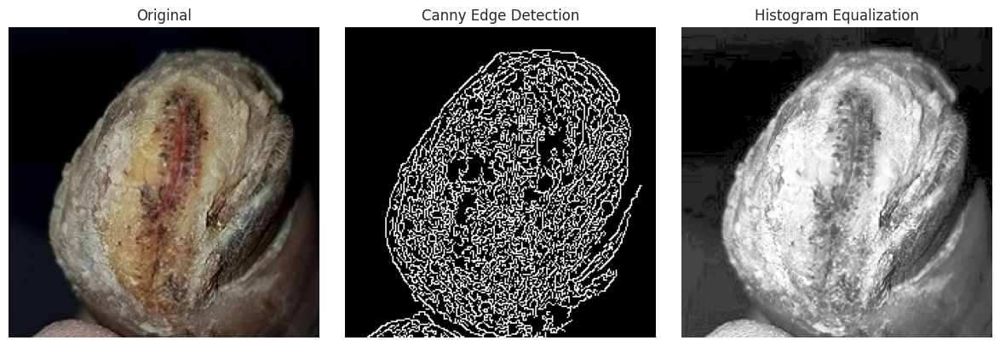

In [ ]:
# Function to visualize preprocessed images
def visualize_preprocessing(filepath):
    img = cv2.imread(filepath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Canny Edge Detection
    canny = cv2.Canny(gray, 50, 150)

    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)

    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(canny, cmap='gray')
    plt.title("Canny Edge Detection")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(hist_eq, cmap='gray')
    plt.title("Histogram Equalization")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
visualize_preprocessing('/content/DFU/Patches/Abnormal(Ulcer)/1.jpg')

**4. Plot Class Distribution**

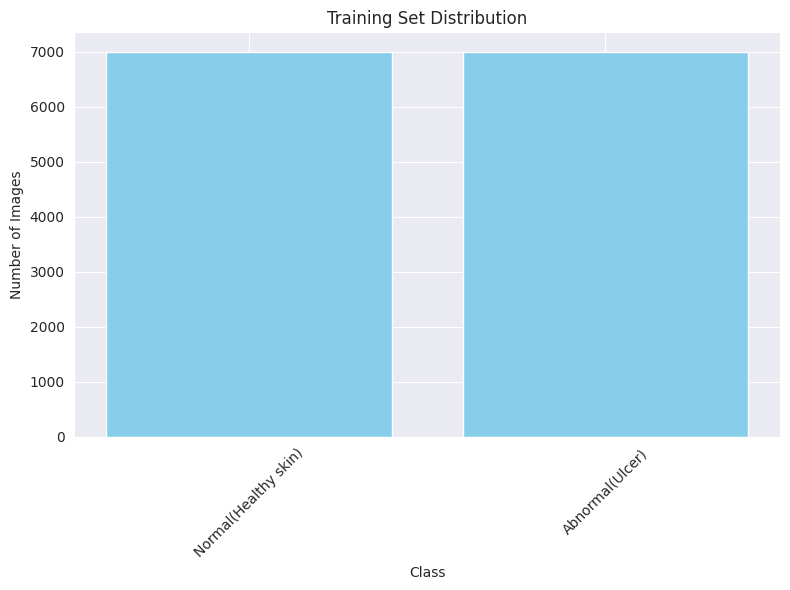

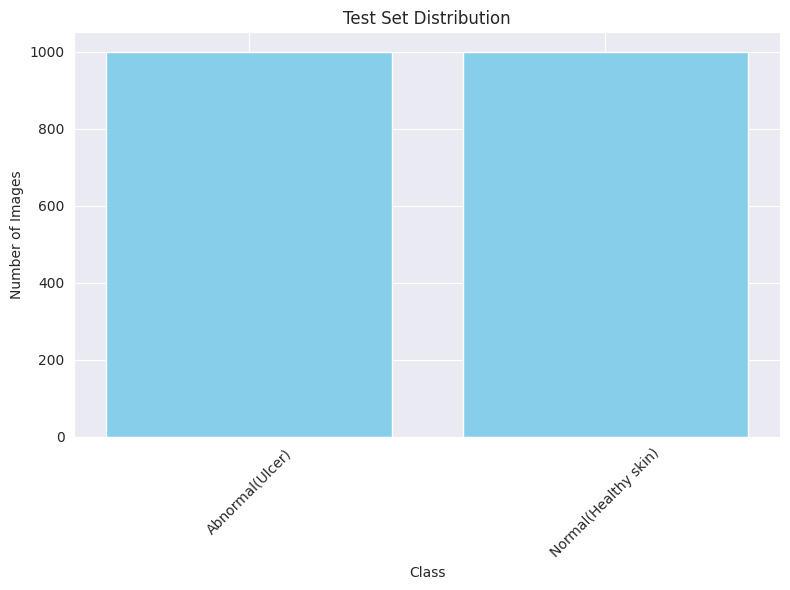

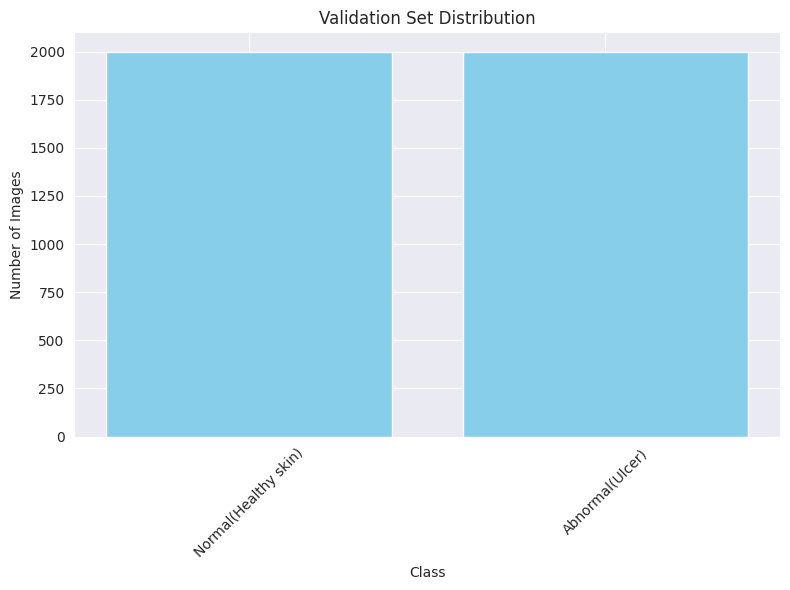

In [ ]:
# Function to plot class distribution
def plot_class_distribution(df, title="Class Distribution"):
    class_counts = df['labels'].value_counts()
    plt.figure(figsize=(8, 6))
    plt.bar(class_counts.index, class_counts.values, color='skyblue')
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Example usage
plot_class_distribution(train_df, title="Training Set Distribution")
plot_class_distribution(test_df, title="Test Set Distribution")
plot_class_distribution(valid_df, title="Validation Set Distribution")

**5.Heatmap Pixel Intensity**

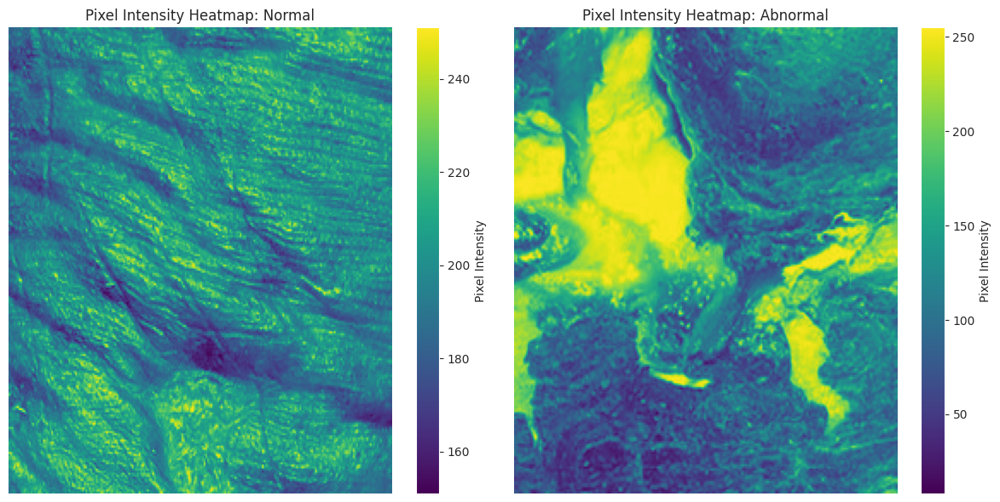

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import cv2

def visualize_heatmap_comparison(normal_image_path, abnormal_image_path, image_size=(224, 224)):
    """
    Compare pixel intensity heatmaps for a Normal image and an Abnormal image.

    Args:
        normal_image_path (str): Path to the Normal image.
        abnormal_image_path (str): Path to the Abnormal image.
        image_size (tuple): Target size for resizing images.
    """
    # Load Normal image
    normal_img = load_img(normal_image_path, target_size=image_size, color_mode='grayscale')
    normal_array = img_to_array(normal_img).squeeze()

    # Load Abnormal image
    abnormal_img = load_img(abnormal_image_path, target_size=image_size, color_mode='grayscale')
    abnormal_array = img_to_array(abnormal_img).squeeze()

    # Plot heatmaps side by side
    plt.figure(figsize=(12, 6))

    # Normal image heatmap
    plt.subplot(1, 2, 1)
    plt.imshow(normal_array, cmap='viridis', aspect='auto')
    plt.colorbar(label="Pixel Intensity")
    plt.title("Pixel Intensity Heatmap: Normal")
    plt.axis('off')

    # Abnormal image heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(abnormal_array, cmap='viridis', aspect='auto')
    plt.colorbar(label="Pixel Intensity")
    plt.title("Pixel Intensity Heatmap: Abnormal")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    normal_image_path = '/content/DFU/Patches/Normal(Healthy skin)/14.jpg'  # Path to Normal image
    abnormal_image_path = '/content/DFU/Patches/Abnormal(Ulcer)/110.jpg'   # Path to Abnormal image

    visualize_heatmap_comparison(normal_image_path, abnormal_image_path)

**6.Pixel Intensity Histogram Comparison: Original vs Augmented**

Comparing Abnormal Images...


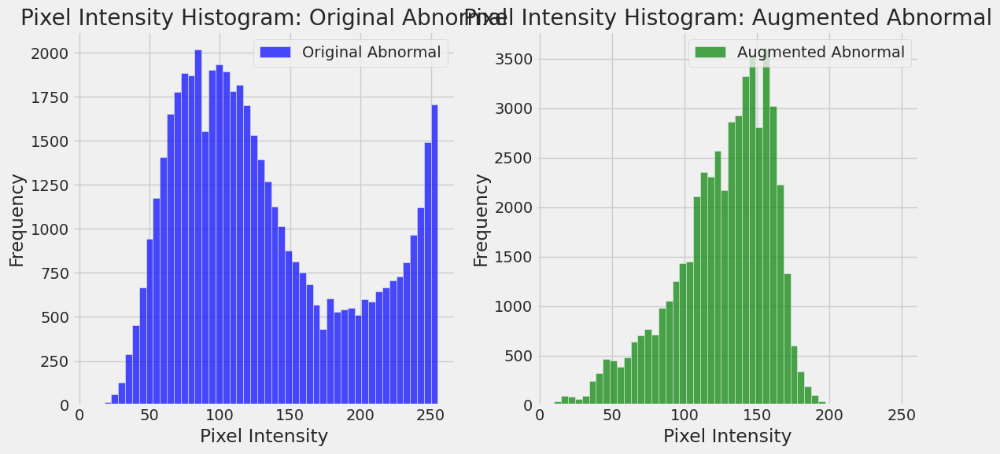

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def plot_histogram_comparison(original_image_path, augmented_image_path, title_original, title_augmented, image_size=(224, 224)):
    """
    Compare pixel intensity histograms for original and augmented abnormal images.

    Args:
        original_image_path (str): Path to the original abnormal image.
        augmented_image_path (str): Path to the augmented abnormal image.
        title_original (str): Title for the original image histogram.
        title_augmented (str): Title for the augmented image histogram.
        image_size (tuple): Target size for resizing images.
    """
    # Load Original Image
    original_img = load_img(original_image_path, target_size=image_size, color_mode='grayscale')
    original_array = img_to_array(original_img).squeeze().flatten()

    # Load Augmented Image
    augmented_img = load_img(augmented_image_path, target_size=image_size, color_mode='grayscale')
    augmented_array = img_to_array(augmented_img).squeeze().flatten()

    # Plot Histograms
    plt.figure(figsize=(12, 6))

    # Original Abnormal Image Histogram
    plt.subplot(1, 2, 1)
    plt.hist(original_array, bins=50, color='blue', alpha=0.7, label='Original Abnormal')
    plt.title(title_original)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    # Augmented Abnormal Image Histogram
    plt.subplot(1, 2, 2)
    plt.hist(augmented_array, bins=50, color='green', alpha=0.7, label='Augmented Abnormal')
    plt.title(title_augmented)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Paths to original and augmented abnormal images
    original_abnormal_path = '/content/DFU/Patches/Abnormal(Ulcer)/110.jpg'
    augmented_abnormal_path = '/content/DFU/AugmentedData/Abnormal(Ulcer)/1020.jpg'

    # Compare Abnormal images
    print("Comparing Abnormal Images...")
    plot_histogram_comparison(
        original_abnormal_path, augmented_abnormal_path,
        title_original="Pixel Intensity Histogram: Original Abnormal",
        title_augmented="Pixel Intensity Histogram: Augmented Abnormal"
    )

**7.Histogram Equalization**

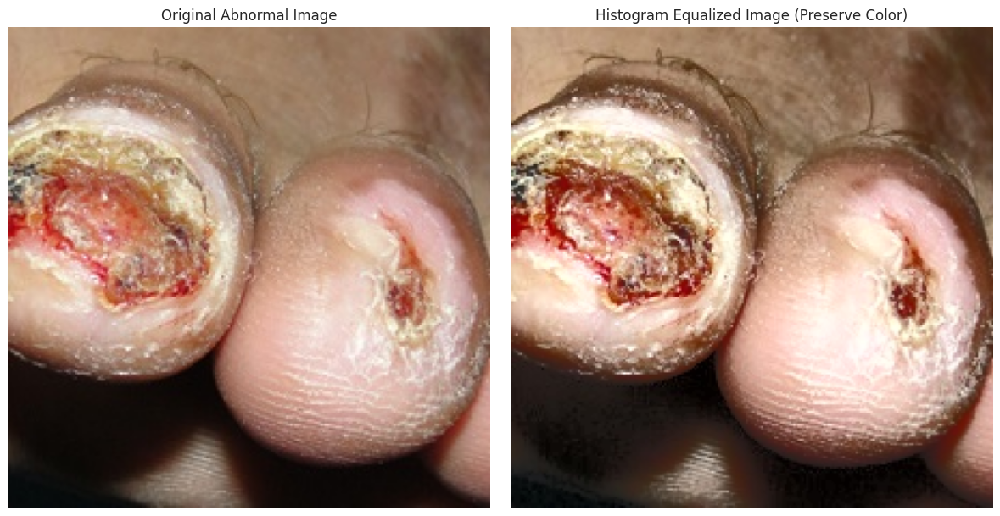

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

def histogram_equalization_color(image_path):
    """
    Apply Histogram Equalization to the luminance channel of a color image in YCrCb space
    and display the original and equalized images side by side.

    Args:
        image_path (str): Path to the image file.
    """
    # Load the original image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Cannot read image at {image_path}")
        return

    # Convert the image to YCrCb color space
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    # Apply Histogram Equalization only on the Y channel (luminance)
    y_channel, cr_channel, cb_channel = cv2.split(img_ycrcb)
    y_equalized = cv2.equalizeHist(y_channel)
    img_ycrcb_equalized = cv2.merge((y_equalized, cr_channel, cb_channel))

    # Convert back to BGR color space
    img_equalized = cv2.cvtColor(img_ycrcb_equalized, cv2.COLOR_YCrCb2BGR)

    # Display the original and equalized images
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Abnormal Image')
    plt.axis('off')

    # Equalized Image
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_equalized, cv2.COLOR_BGR2RGB))
    plt.title('Histogram Equalized Image (Preserve Color)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    image_path = '/content/DFU/Patches/Abnormal(Ulcer)/101.jpg'
    histogram_equalization_color(image_path)

**8.UMAP Visualization**

In [ ]:
pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.6 MB/s eta 0:00:00


Loading data...
Applying UMAP...


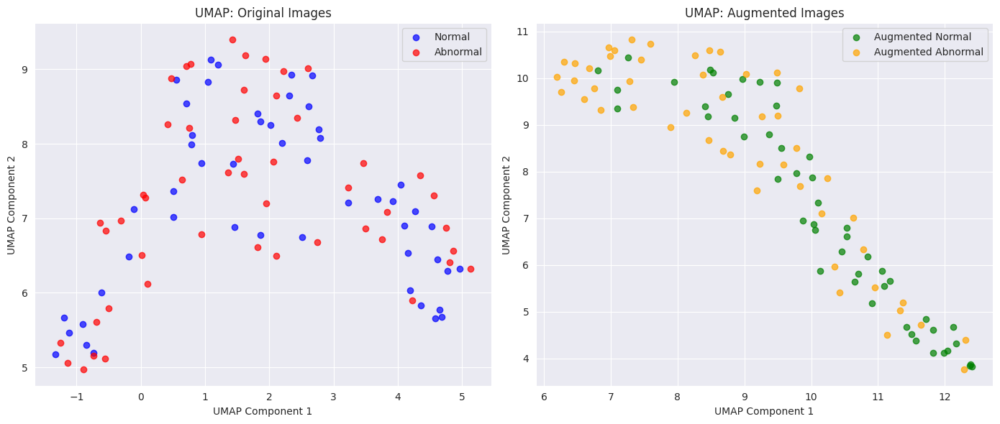

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def load_images_from_folder(folder, num_images=50, image_size=(64, 64)):
    """
    Load images from a folder, resize them, and convert them to flattened vectors.

    Args:
        folder (str): Path to the image folder.
        num_images (int): Number of images to load.
        image_size (tuple): Target size for resizing images.

    Returns:
        np.array: Flattened image vectors.
    """
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    image_files = image_files[:num_images]

    image_data = []
    for file in image_files:
        img_path = os.path.join(folder, file)
        img = load_img(img_path, target_size=image_size, color_mode='grayscale')
        img_array = img_to_array(img).flatten()
        image_data.append(img_array)
    return np.array(image_data)

def visualize_umap(normal_folder, abnormal_folder, augmented_normal_folder, augmented_abnormal_folder, num_images=50, image_size=(64, 64)):
    """
    Visualize data using UMAP for both original and augmented datasets.

    Args:
        normal_folder (str): Path to original Normal images.
        abnormal_folder (str): Path to original Abnormal images.
        augmented_normal_folder (str): Path to augmented Normal images.
        augmented_abnormal_folder (str): Path to augmented Abnormal images.
        num_images (int): Number of images to process.
        image_size (tuple): Image resize dimensions.
    """
    # Load original and augmented data
    print("Loading data...")
    normal_data = load_images_from_folder(normal_folder, num_images, image_size)
    abnormal_data = load_images_from_folder(abnormal_folder, num_images, image_size)
    aug_normal_data = load_images_from_folder(augmented_normal_folder, num_images, image_size)
    aug_abnormal_data = load_images_from_folder(augmented_abnormal_folder, num_images, image_size)

    # Combine data and labels
    original_data = np.vstack((normal_data, abnormal_data))
    augmented_data = np.vstack((aug_normal_data, aug_abnormal_data))
    labels_original = ['Normal'] * num_images + ['Abnormal'] * num_images
    labels_augmented = ['Augmented Normal'] * num_images + ['Augmented Abnormal'] * num_images

    # Standardize data
    original_data = StandardScaler().fit_transform(original_data)
    augmented_data = StandardScaler().fit_transform(augmented_data)

    # Apply UMAP
    print("Applying UMAP...")
    umap_original = umap.UMAP(n_components=2, random_state=42).fit_transform(original_data)
    umap_augmented = umap.UMAP(n_components=2, random_state=42).fit_transform(augmented_data)

    # Plot UMAP Results
    plt.figure(figsize=(14, 6))

    # Original Data Visualization
    plt.subplot(1, 2, 1)
    for label, color in zip(['Normal', 'Abnormal'], ['blue', 'red']):
        indices = [i for i, lbl in enumerate(labels_original) if lbl == label]
        plt.scatter(umap_original[indices, 0], umap_original[indices, 1], label=label, alpha=0.7, c=color)
    plt.title('UMAP: Original Images')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.legend()

    # Augmented Data Visualization
    plt.subplot(1, 2, 2)
    for label, color in zip(['Augmented Normal', 'Augmented Abnormal'], ['green', 'orange']):
        indices = [i for i, lbl in enumerate(labels_augmented) if lbl == label]
        plt.scatter(umap_augmented[indices, 0], umap_augmented[indices, 1], label=label, alpha=0.7, c=color)
    plt.title('UMAP: Augmented Images')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    normal_folder = '/content/DFU/Patches/Normal(Healthy skin)'
    abnormal_folder = '/content/DFU/Patches/Abnormal(Ulcer)'
    augmented_normal_folder = '/content/DFU/AugmentedData/Normal(Healthy skin)'
    augmented_abnormal_folder = '/content/DFU/AugmentedData/Abnormal(Ulcer)'

    visualize_umap(normal_folder, abnormal_folder, augmented_normal_folder, augmented_abnormal_folder, num_images=50)

## Train Image Samples

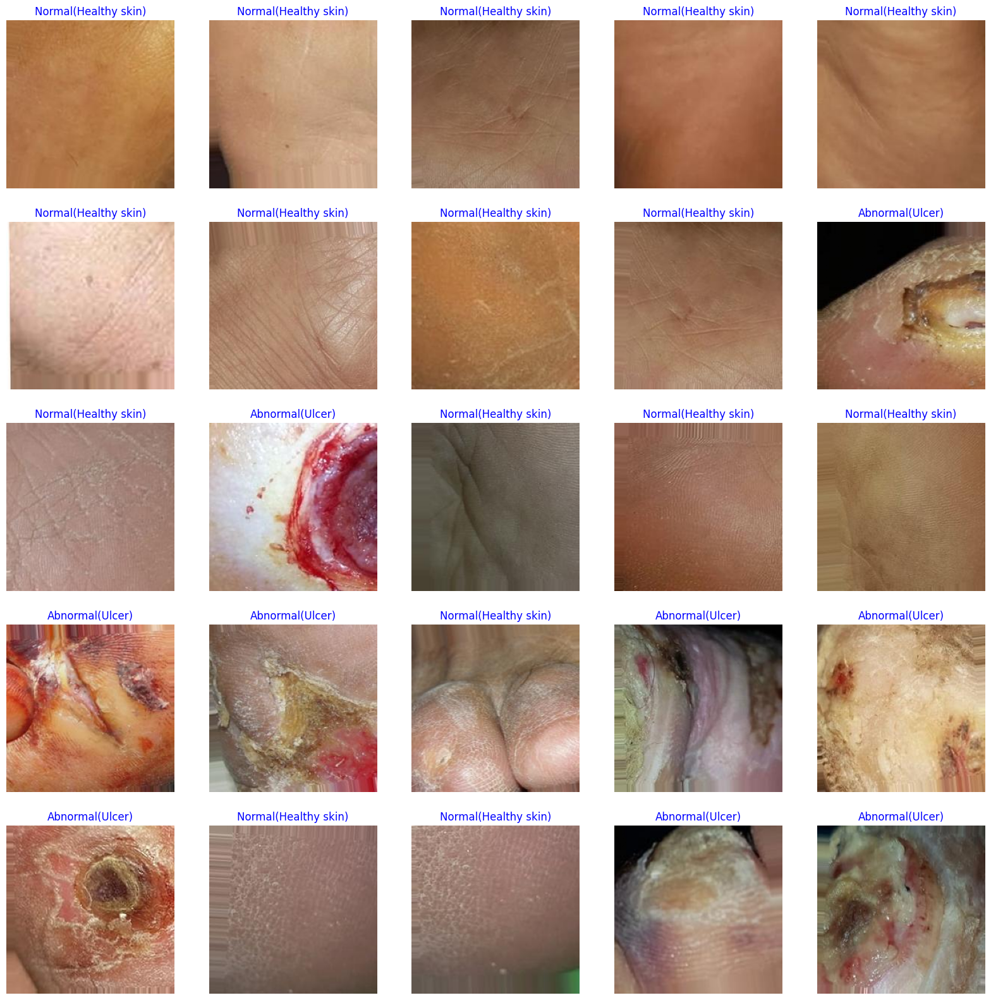

In [ ]:
show_image_samples(train_gen)

# **Xception**

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras import Model, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
import numpy as np

# Define input shape and number of classes
img_shape = (224, 224, 3)  # Image dimensions
class_count = 2  # Number of classes (binary classification)

# Create the base model with Xception
base_model = Xception(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
    pooling=None  # Set to None to add custom pooling layer
)

# Freeze the base model layers to avoid training them initially
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top of Xception
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
x = Dropout(rate=0.5)(x)
x = Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001))(x)
x = Dropout(rate=0.5)(x)
output = Dense(class_count, activation='softmax')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=output)

# Compile the model with Adam optimizer
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Xception model created and compiled successfully.")

# Custom Callback for Learning Rate Scheduling
class CustomLearningRateScheduler(Callback):
    def __init__(self, patience, stop_patience, factor, dwell):
        super(CustomLearningRateScheduler, self).__init__()
        self.patience = patience
        self.stop_patience = stop_patience
        self.factor = factor
        self.dwell = dwell
        self.best_weights = None
        self.best = np.Inf
        self.wait = 0
        self.lr_reduced = 0

    def on_train_begin(self, logs=None):
        self.best = np.Inf
        self.wait = 0
        self.lr_reduced = 0

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get('val_loss')
        if current < self.best:
            self.best = current
            self.wait = 0
            if self.dwell:
                self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.lr_reduced += 1
                optimizer = self.model.optimizer
                new_lr = float(tf.keras.backend.get_value(optimizer.learning_rate)) * self.factor
                new_lr = max(new_lr, 1e-6)  # Minimum learning rate
                tf.keras.backend.set_value(optimizer.learning_rate, new_lr)
                print(f"\nEpoch {epoch + 1}: Reducing learning rate to {new_lr:.6f}")
                self.wait = 0
                if self.dwell and self.best_weights is not None:
                    self.model.set_weights(self.best_weights)
                    print(f"Epoch {epoch + 1}: Restored best weights")

                if self.lr_reduced >= self.stop_patience:
                    self.model.stop_training = True
                    print(f'\nEpoch {epoch + 1}: Early stopping due to lack of improvement.')

# Reset session to clear memory
def reset_session():
    from tensorflow.keras.backend import clear_session
    clear_session()

reset_session()

# Training parameters
epochs = 10
patience = 5
stop_patience = 10
factor = 0.5
dwell = True

# Initialize callbacks
callbacks_initial = [
    CustomLearningRateScheduler(patience=patience, stop_patience=stop_patience, factor=factor, dwell=dwell),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_loss', save_best_only=True, verbose=1),
    EarlyStopping(patience=10, restore_best_weights=True, verbose=1)
]

# Assume train_gen and valid_gen are the data generators
history = model.fit(
    train_gen,
    epochs=epochs,
    validation_data=valid_gen,
    callbacks=callbacks_initial,
    verbose=1
)

print("Initial training completed successfully.")

# Fine-tuning: Unfreeze some layers of Xception
for layer in base_model.layers[-30:]:  # Unfreeze last 30 layers
    layer.trainable = True

# Recompile model with smaller learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Starting fine-tuning...")

# Fine-tune the model
history_finetune = model.fit(
    train_gen,
    epochs=3,  # Fine-tune for additional 3 epochs
    validation_data=valid_gen,
    callbacks=callbacks_initial,
    verbose=1
)

print("Fine-tuning completed successfully.")

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Xception model created and compiled successfully.
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.8103 - loss: 1.4756
Epoch 1: val_loss improved from inf to 1.01066, saving model to best_model.keras
467/467 ━━━━━━━━━━━━━━━━━━━━ 105s 185ms/step - accuracy: 0.8104 - loss: 1.4752 - val_accuracy: 0.9495 - val_loss: 1.0107 - learning_rate: 1.0000e-04
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.9250 - loss: 1.0475
Epoch 2: val_loss improved from 1.01066 to 0.88410, saving model to best_model.keras
467/467 ━━━━━━━━━━━━━━━━━━━━ 68s 145ms/step - accuracy: 0.9250 - loss: 1.0475 - val_accuracy: 0.9678 - val_loss: 0.8841 - learning_rate: 1.0000e-04
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.9429 - loss: 0.9220
Epoch 3: val_loss improved from 0.88410 to 0.80062, saving model to best_model.keras
467/467 ━━━━━━━━━━━━━━━━━━━━ 68s 145ms/step - accuracy: 0.9429 - loss: 0.9219 - val_acc

## Train Validation Graph

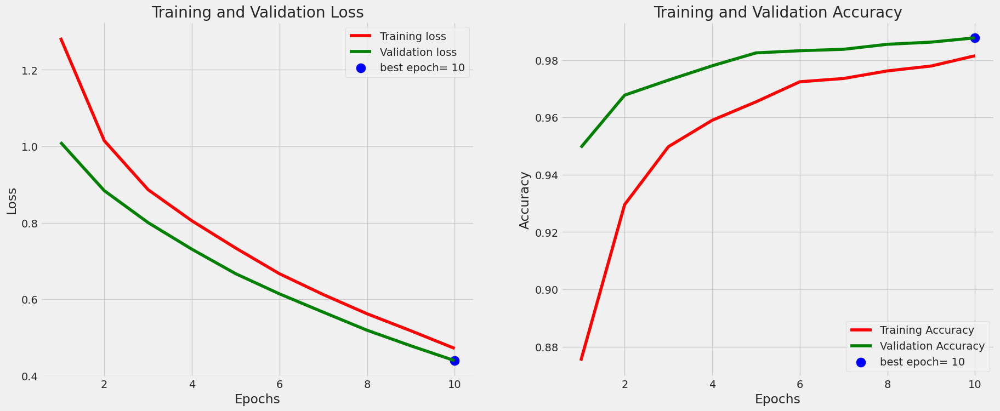

500/500 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - accuracy: 0.9789 - loss: 0.4556
Accuracy on the test set: 98.25%



model was saved as /content/DFU/Models/ulcer_classification_Xception-ulcers-98.25.h5

class csv file was saved as /content/DFU/Models/class_dict.csv



In [ ]:
# Plot training and validation loss
tr_plot(history, 0)  # Ensure `tr_plot` is defined

# Set parameters for evaluation and saving
subject = 'ulcers'

# Evaluate accuracy on the test set
# Ensure `test_gen` and `test_batch_size` are defined
acc = model.evaluate(test_gen, batch_size=test_batch_size, verbose=1, steps=len(test_gen), return_dict=False)[1] * 100

# Print the accuracy result in color
msg = f'Accuracy on the test set: {acc:.2f}%'
print_in_color(msg, (0, 255, 0), (55, 65, 80))  # Ensure `print_in_color` is defined

# Define parameters for saving the model and results
generator = train_gen  # Ensure `train_gen` is defined
save_path = '/content/DFU/Models'  # Replace with the actual path where you want to save the files
model_name = 'ulcer_classification_Xception'  # Adjust to your desired model name
img_size = img_shape  # Input image size, e.g., (224, 224)
scalar = 1  # Scale factor

# Call `saver` with the required arguments
model_save_loc, csv_save_loc = saver(
    save_path=save_path,             # Path to save the model and CSV
    model=model,                     # Model object to be saved
    model_name=model_name,           # Model name
    subject=subject,                 # Subject or description of the model
    accuracy=acc,                    # Accuracy of the model
    img_size=img_size,               # Image size
    scalar=scalar,                   # Scale factor
    generator=generator              # Data generator
)

# Optionally, save accuracy manually to CSV if needed
with open(csv_save_loc, 'a') as f:
    f.write(f"\nAccuracy: {acc:.2f}%")

##Classification Report

500/500 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step


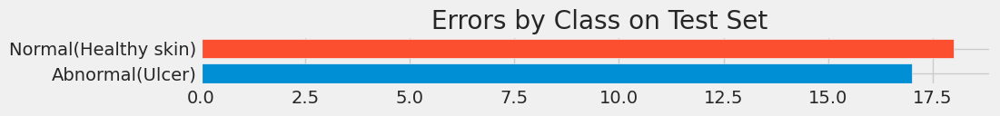

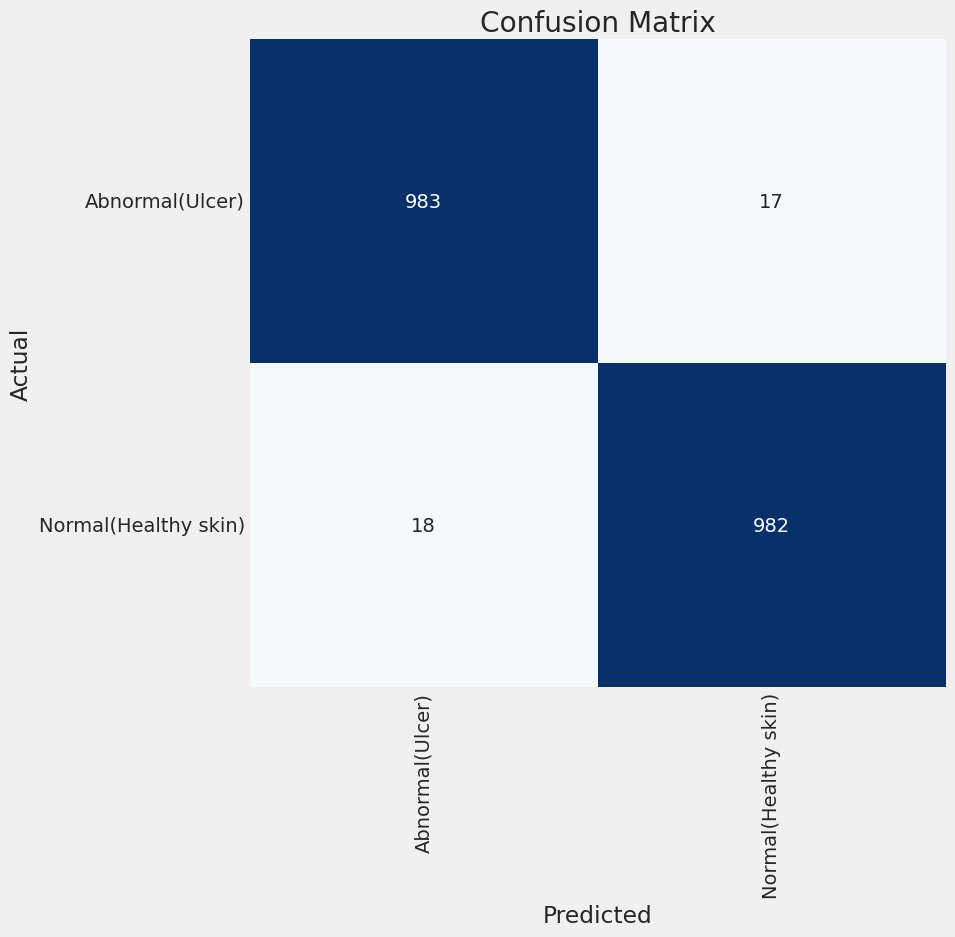

Classification Report:
----------------------
                       precision    recall  f1-score   support

     Abnormal(Ulcer)       0.98      0.98      0.98      1000
Normal(Healthy skin)       0.98      0.98      0.98      1000

            accuracy                           0.98      2000
           macro avg       0.98      0.98      0.98      2000
        weighted avg       0.98      0.98      0.98      2000

True Positives (TP): 982
True Negatives (TN): 983
False Positives (FP): 17
False Negatives (FN): 18
Sensitivity (Recall): 0.9820
Specificity: 0.9830


In [ ]:
# Define working directory for saving outputs
working_dir = '/content/DFU/Results'  # Set this to your desired output directory

# Make sure the directory exists
import os
os.makedirs(working_dir, exist_ok=True)

# Run predictions on the test set
print_code = 0  # Modify as needed if `print_code` controls output format
preds = model.predict(test_gen)  # Run predictions

# Generate and print classification report
# Ensure `print_info` is defined to accept these arguments
print_info(test_gen, preds, print_code, working_dir, subject)

# Assuming y_true (actual labels) and y_pred_labels (predicted class labels) are ready
y_true = test_gen.classes  # True labels from the test generator
y_pred_labels = np.argmax(preds, axis=1)  # Convert probabilities to class labels

# Calculate Confusion Matrix
tn, fp, fn, tp = confusion_matrix(y_true, y_pred_labels).ravel()

# Calculate Sensitivity (Recall) and Specificity
sensitivity = tp / (tp + fn)  # True Positive Rate
specificity = tn / (tn + fp)  # True Negative Rate

# Print the results
print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")

print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")

# Testing on a image

In [ ]:
store_path=os.path.join(working_dir, 'storage')
if os.path.isdir(store_path):
    shutil.rmtree(store_path)
os.mkdir(store_path)
# input an image of an ulcer
img_path=r'/content/DFU/Patches/Abnormal(Ulcer)/1.jpg'
img=cv2.imread(img_path,  cv2.IMREAD_REDUCED_COLOR_2)
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# model was trained on rgb images so convert image to rgb
file_name=os.path.split(img_path)[1]
dst_path=os.path.join(store_path, file_name)
cv2.imwrite(dst_path, img)
# check if the directory was created and image stored
print (os.listdir(store_path))

['1.jpg']


 Model is being loaded- this will take about 10 seconds


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
 image is of class Abnormal(Ulcer) with a probability of  100.00 %



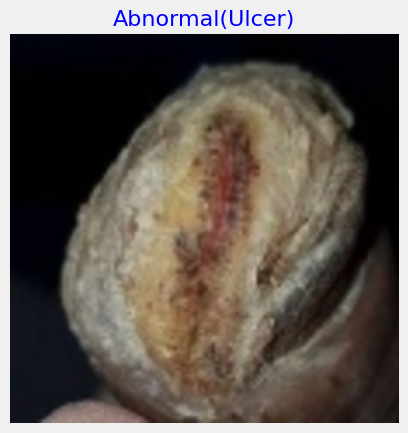

In [ ]:
csv_path=csv_save_loc # path to class_dict.csv
model_path=model_save_loc # path to the trained model
class_name, probability=predictor(store_path, csv_path,  model_path, crop_image = False) # run the classifier
msg=f' image is of class {class_name} with a probability of {probability * 100: 6.2f} %'
print_in_color(msg, (0,255,255), (65,85,55))

In [ ]:
from google.colab import files
files.download('/content/DFU/Models/ulcer_classification_Xception-ulcers-98.25.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#                                                                         **END**